In [1]:

import pandas as pd 
import scanpy as sc
# Settings the warnings to be ignored 
import warnings 
warnings.filterwarnings('ignore') 
import os
import pyVIA.core as via
import pyVIA.datasets_via as datasets
import numpy as np
import matplotlib.pyplot as plt

2025-04-29 16:55:57.721603: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745916957.745387 1492385 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745916957.752580 1492385 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-29 16:55:57.778744: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


/home/heshidian/.local/lib/python3.10/site-packages/phate/__init__.py


In [2]:
os.chdir("/media/heshidian/RAID5_42TB/0.MyFiles/1.BGI/6.Cartialgenous/Stereo-seq/骨轨迹")

In [3]:
adata = sc.read("Osteoblasts_sub.h5ad")
print(adata.X.shape)
adata_raw = adata

(13455, 13761)


In [6]:
print(adata.obsm_keys())

['X_pca', 'X_umap']


In [7]:
import scipy

# 如果是稀疏矩阵，先转成 dense matrix
if scipy.sparse.issparse(adata.X):
    X_dense = adata.X.toarray()
else:
    X_dense = adata.X

print(np.isnan(X_dense).sum())

0


In [8]:
sc.pp.filter_genes(adata, min_cells=3)   # 至少在3个细胞里有表达
print(adata.X.shape)

(13455, 13761)


In [9]:
print(adata.obsm_keys)

<bound method AnnData.obsm_keys of AnnData object with n_obs × n_vars = 13455 × 13761
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'X_index', 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'x', 'y', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1.4', 'seurat_clusters', 'SCT_snn_res.1.2', 'SCT_snn_res.1', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.0.95', 'SCT_snn_res.0.93', 'SCT_snn_res.0.94', 'SCT_snn_res.0.935', 'SPOTlight_spatial_ss', 'SPOTlight_Spatial..AnMCs', 'SPOTlight_Spatial..Chondroclasts', 'SPOTlight_Spatial..Chondrocytes', 'SPOTlight_Spatial..Endothelial.cells', 'SPOTlight_Spatial..Hypertrophic.chondrocytes', 'SPOTlight_Spatial..Mast.cells', 'SPOTlight_Spatial..Monocytes_Macrophages', 'SPOTlight_Spatial..Mural.cells', 'SPOTlight_Spatial..Progenitor.cells', 'SPOTlight_Spatial..Proliferative_progenitor.cells', 'SPOTlight_SCT_ss', 'SPOTlight_SCT..AnMCs', 'SPOTlight_SCT..Chondroclasts', 'SPOTlight_SCT..Chondrocytes', 'SPOTlight_SCT..Endothelial.cells', 'SPOTl

In [10]:
# distances_dense = adata.obsp['distances'].toarray()
# connectivities_dense = 1 - distances_dense
# connectivities_dense[connectivities_dense < 0] = 0
# connectivities_sparse = sp.csr_matrix(connectivities_dense)
# adata.obsp['connectivities'] = connectivities_sparse

# 再告诉Scanpy在哪里
# adata.uns['neighbors']['connectivities_key'] = 'connectivities'
# adata.uns['neighbors']['distances_key'] = 'distances'

# 然后直接跑leiden
# sc.tl.leiden(adata, resolution=1.2, key_added='leiden_new')

In [11]:
from sklearn_ann.kneighbors.annoy import AnnoyTransformer

In [12]:
# sc.pp.neighbors(adata, use_rep=None, n_neighbors=20, method='gauss', metric='euclidean')
sc.pp.neighbors(adata, transformer=AnnoyTransformer(20))

In [13]:
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_new', flavor='igraph')

In [14]:
print(adata.obs['leiden_new'].dtype)

category


In [15]:
adata.obs['leiden_new'] = 'C_' + adata.obs['leiden_new'].astype(str)

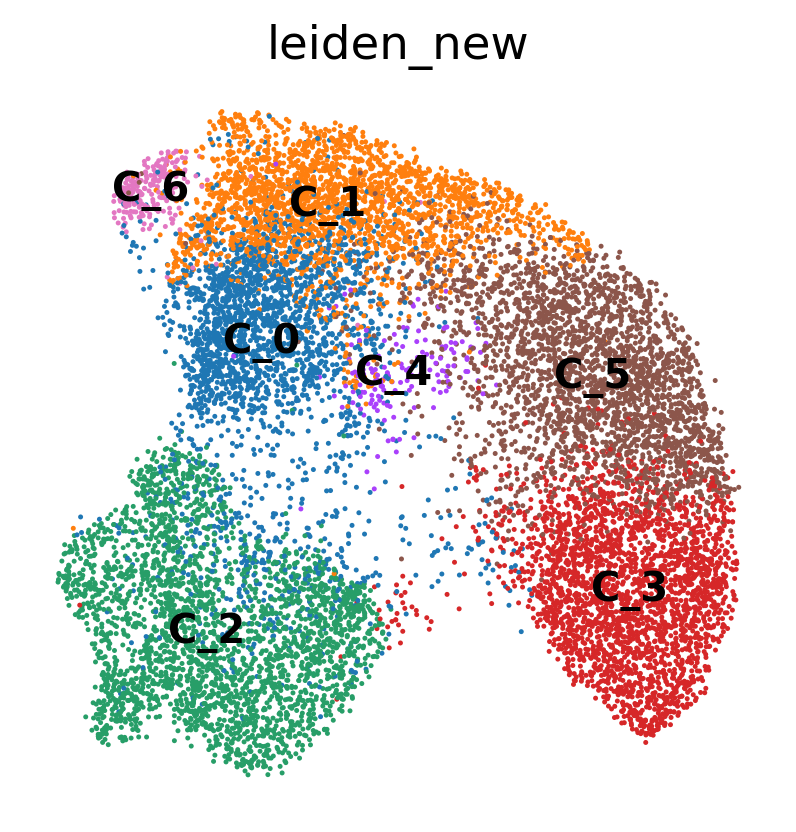

In [16]:
sc.pl.umap(adata, color=['leiden_new'], show=True, # palette=list(matplotlib.colors.CSS4_COLORS.values()),
           legend_loc='on data', legend_fontsize=12, frameon=False)

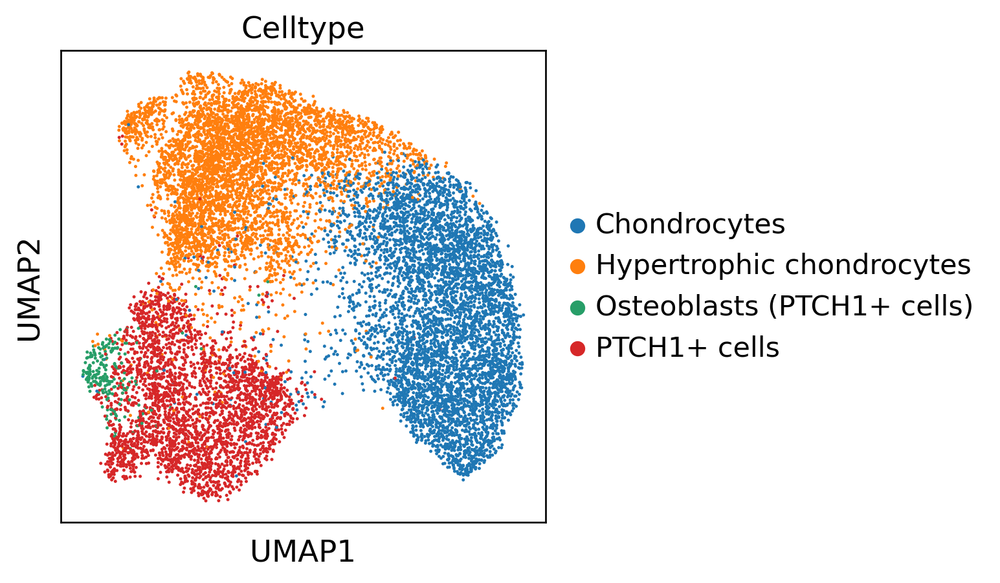

In [17]:
sc.pl.umap(adata, color='Celltype', show=True)

In [18]:
embedding = adata.obsm['X_umap']

In [19]:
ncomps=30
knn=15
v0_random_seed=4
root_user = ["Chondrocytes"]
memory = 10
dataset = ''
clusters = 'Celltype'
basis = "X_umap"

In [20]:
import ipywidgets as widgets
widgets.IntSlider()


IntSlider(value=0)

In [21]:
v0 = via.VIA(data=adata.obsm['X_pca'][:, 0:ncomps], true_label=adata.obs[clusters], 
             edgepruning_clustering_resolution=0.15, cluster_graph_pruning=0.15,
             knn=knn,  root_user=root_user, resolution_parameter=1.5,
             dataset=dataset, random_seed=v0_random_seed, memory=memory)#, do_compute_embedding=True, embedding_type='via-atlas')

v0.run_VIA()


2025-04-29 16:57:07.343801	Running VIA over input data of 13455 (samples) x 30 (features)
2025-04-29 16:57:07.343894	Knngraph has 15 neighbors
2025-04-29 16:57:10.188223	Finished global pruning of 15-knn graph used for clustering at level of 0.15. Kept 45.0 % of edges. 
2025-04-29 16:57:10.245512	Number of connected components used for clustergraph  is 1
2025-04-29 16:57:10.576229	Commencing community detection
2025-04-29 16:57:11.553048	Finished community detection. Found 291 clusters.
2025-04-29 16:57:11.558988	Merging 251 very small clusters (<10)
2025-04-29 16:57:11.564328	Finished detecting communities. Found 40 communities
2025-04-29 16:57:11.565493	Making cluster graph. Global cluster graph pruning level: 0.15
2025-04-29 16:57:11.588009	Graph has 1 connected components before pruning
2025-04-29 16:57:11.590857	Graph has 1 connected components after pruning
2025-04-29 16:57:11.591017	Graph has 1 connected components after reconnecting
2025-04-29 16:57:11.591613	3.6% links trimmed

  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
2025-04-29 16:57:19.012310	Identifying terminal clusters corresponding to unique lineages...
2025-04-29 16:57:19.012338	Closeness:[2, 3, 5, 12, 15, 16, 17, 18, 19, 20, 21, 25, 26, 27, 28, 29, 32, 34]
2025-04-29 16:57:19.012350	Betweenness:[0, 1, 5, 6, 12, 15, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 32, 33, 34, 35, 36, 38, 39]
2025-04-29 16:57:19.012360	Out Degree:[12, 13, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 32, 34, 35, 36, 38, 39]
2025-04-29 16:57:19.012537	Cluster 15 had 3 or more neighboring terminal states [18, 25, 39] and so we removed cluster 15
2025-04-29 16:57:19.012566	Cluster 16 had 3 or more neighboring terminal states [12, 17, 38] and so we removed cluster 12
2025-04-29 16:57:19.012589	Cluster 17 had 3 or more neighboring terminal states [16, 19, 20] and so we removed cluster 16
2025-04-29 16:57:19.012626	Cluster 20 had 3 or more neighboring terminal states [17, 24, 36] and so we removed cluster 20


  0%|          | 0/1000 [00:00<?, ?it/s]

2025-04-29 16:57:21.847333	Cluster or terminal cell fate 17 is reached 534.0 times
2025-04-29 16:57:21.910175	Cluster or terminal cell fate 18 is reached 174.0 times
2025-04-29 16:57:21.948226	Cluster or terminal cell fate 19 is reached 826.0 times
2025-04-29 16:57:22.010563	Cluster or terminal cell fate 21 is reached 170.0 times
2025-04-29 16:57:22.080349	Cluster or terminal cell fate 22 is reached 19.0 times
2025-04-29 16:57:22.118677	Cluster or terminal cell fate 24 is reached 826.0 times
2025-04-29 16:57:22.183164	Cluster or terminal cell fate 26 is reached 107.0 times
2025-04-29 16:57:22.250508	Cluster or terminal cell fate 27 is reached 35.0 times
2025-04-29 16:57:22.319497	Cluster or terminal cell fate 34 is reached 28.0 times
2025-04-29 16:57:22.380654	Cluster or terminal cell fate 36 is reached 218.0 times
2025-04-29 16:57:22.446296	Cluster or terminal cell fate 38 is reached 97.0 times
2025-04-29 16:57:22.511626	Cluster or terminal cell fate 39 is reached 135.0 times
2025-04-

tune edges False


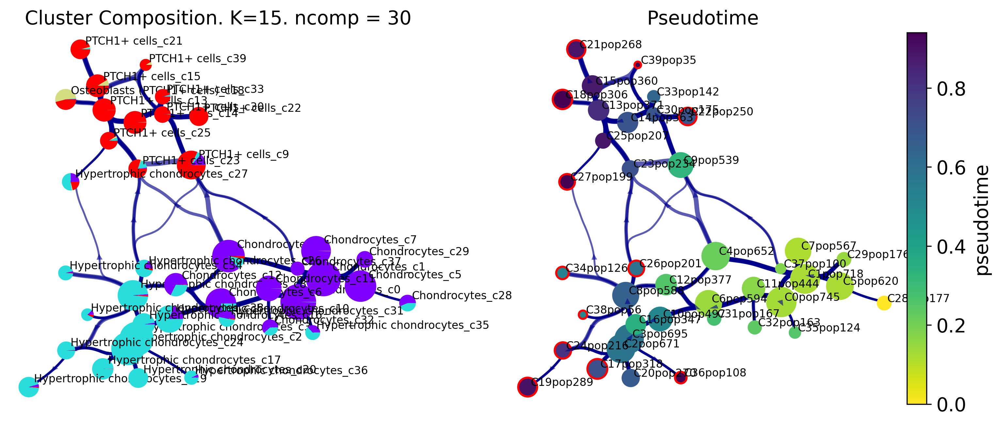

In [22]:
fig, ax, ax1 = via.plot_piechart_viagraph(via_object=v0, show_legend=False)
fig.set_size_inches(12,5)

In [23]:
import numpy as np
np.int = int  # 临时修复弃用的问题

import pygam as pg  # 然后再导入 pygam

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################  

2025-04-29 16:58:19.447524	Super cluster 17 is a super terminal with sub_terminal cluster 17
2025-04-29 16:58:19.447601	Super cluster 18 is a super terminal with sub_terminal cluster 18
2025-04-29 16:58:19.447619	Super cluster 19 is a super terminal with sub_terminal cluster 19
2025-04-29 16:58:19.447632	Super cluster 21 is a super terminal with sub_terminal cluster 21
2025-04-29 16:58:19.447645	Super cluster 22 is a super terminal with sub_terminal cluster 22
2025-04-29 16:58:19.447658	Super cluster 24 is a super terminal with sub_terminal cluster 24
2025-04-29 16:58:19.447672	Super cluster 26 is a super terminal with sub_terminal cluster 26
2025-04-29 16:58:19.447685	Super cluster 27 is a super terminal with sub_terminal cluster 27
2025-04-29 16:58:19.447702	Super cluster 34 is a super terminal with sub_terminal cluster 34
2025-04-29 16:58:19.447716	Super cluster 36 is a super terminal with sub_terminal cluster 36
2025-04-29 16:58:19.447739	Super cluster 38 is a super terminal with s

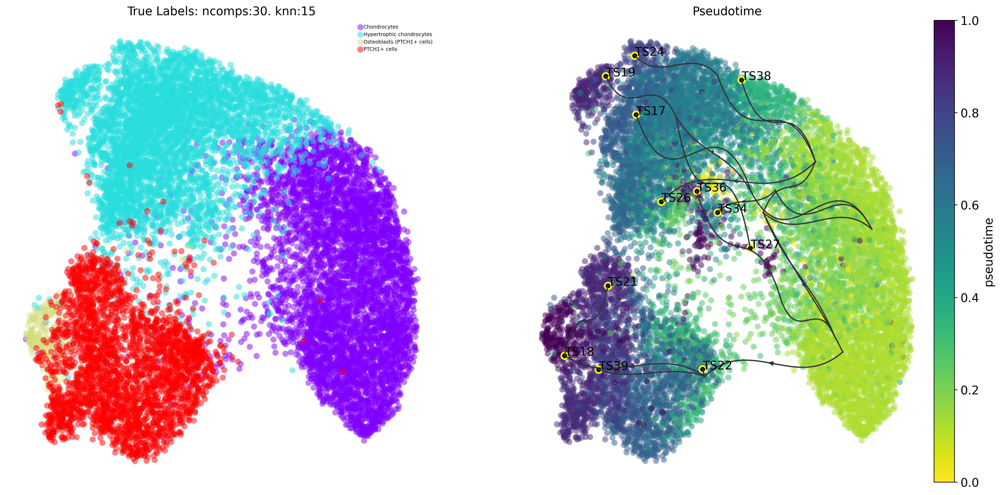

In [24]:
fig, ax, ax1 = via.plot_trajectory_curves(via_object=v0,embedding=embedding, draw_all_curves=False)

2025-04-29 16:58:30.252883	Computing Edges
2025-04-29 16:58:30.253008	Start finding milestones
2025-04-29 16:58:32.491571	End milestones with 150
2025-04-29 16:58:32.524762	Recompute weights
2025-04-29 16:58:32.566647	pruning milestone graph based on recomputed weights
2025-04-29 16:58:32.568209	Graph has 1 connected components before pruning
2025-04-29 16:58:32.568954	Graph has 1 connected components after pruning
2025-04-29 16:58:32.569154	Graph has 1 connected components after reconnecting
2025-04-29 16:58:32.571191	regenerate igraph on pruned edges
2025-04-29 16:58:32.591734	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2025-04-29 16:58:32.628716	Making smooth edges
inside add sc embedding second if


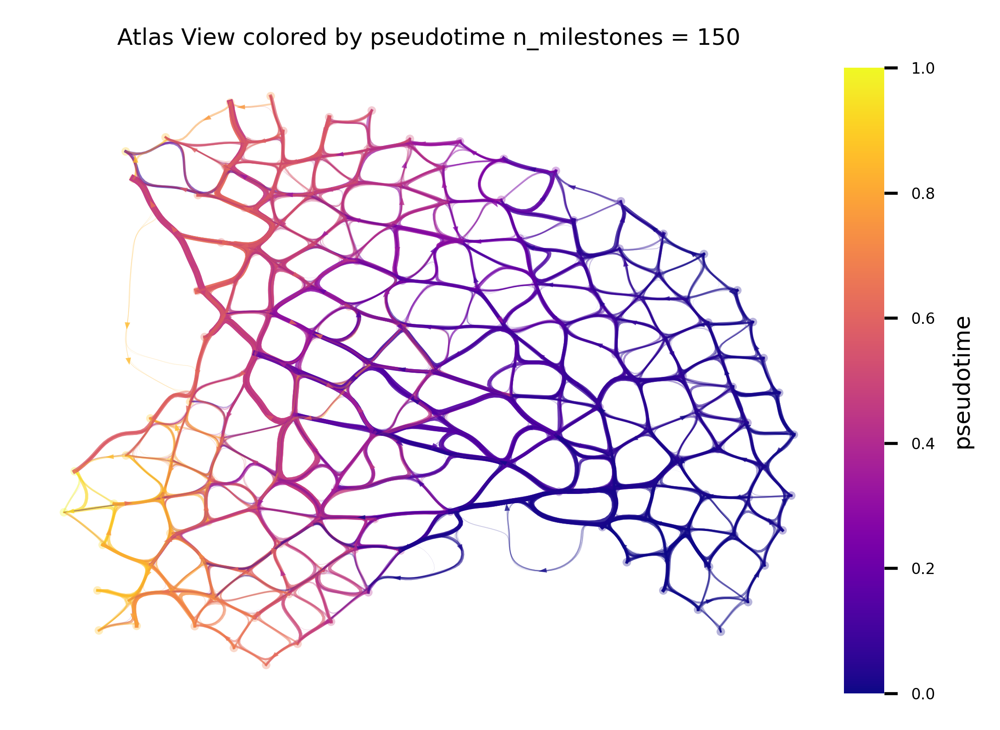

In [25]:
v0.embedding = embedding
fig, ax = via.plot_atlas_view(via_object=v0,  n_milestones=150, sc_labels=adata.obs[clusters],
                              fontsize_labels=3, extra_title_text='Atlas View colored by pseudotime')
fig.set_size_inches(4,3)

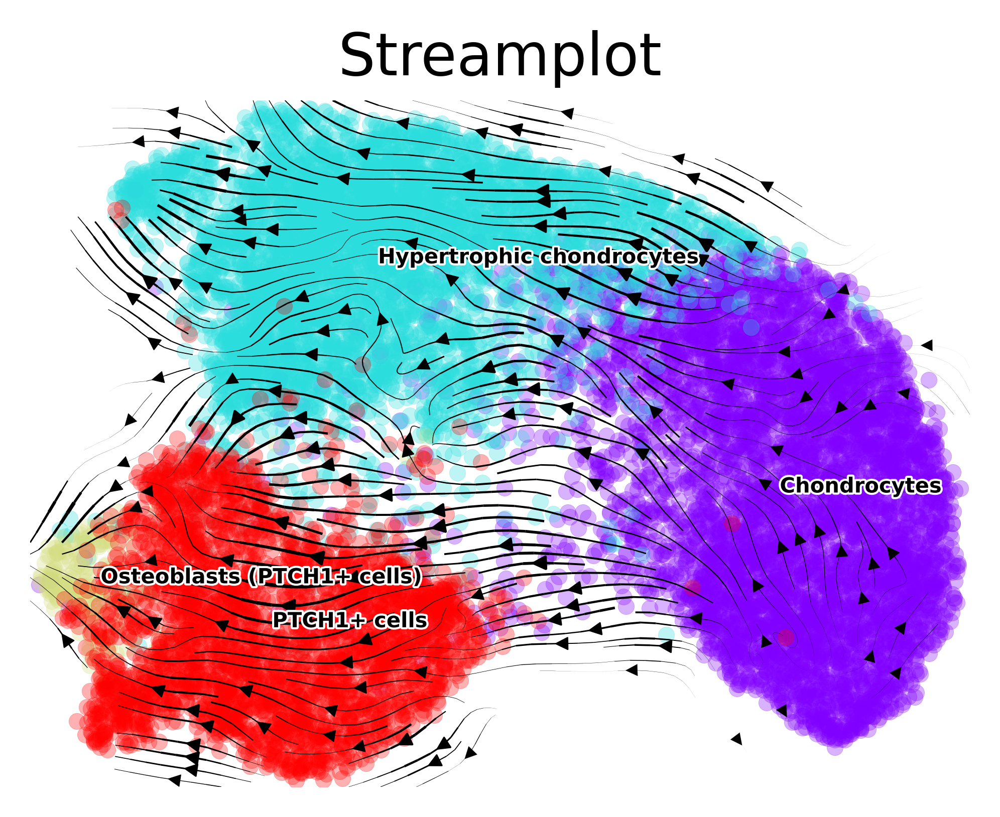

In [26]:
# via_streamplot() requires you to either provide an ndarray as embedding as an input parameter OR for via to have an embedding attribute
fig, ax = via.via_streamplot(v0, embedding=embedding, density_grid=0.5,
                             scatter_size=15, scatter_alpha=0.3, linewidth=0.5)
fig.set_size_inches(4,3)

In [27]:
via.via_streamplot??

Signature:
via.via_streamplot(
    via_object,
    embedding: numpy.ndarray = None,
    density_grid: float = 0.5,
    arrow_size: float = 0.7,
    arrow_color: str = 'k',
    color_dict: dict = None,
    arrow_style='-|>',
    max_length: int = 4,
    linewidth: float = 1,
    min_mass=1,
    cutoff_perc: int = 5,
    scatter_size: int = 500,
    scatter_alpha: float = 0.5,
    marker_edgewidth: float = 0.1,
    density_stream: int = 2,
    smooth_transition: int = 1,
    smooth_grid: float = 0.5,
    color_scheme: str = 'annotation',
    add_outline_clusters: bool = False,
    cluster_outline_edgewidth=0.001,
    gp_color='white',
    bg_color='black',
    dpi=300,
    title='Streamplot',
    b_bias=20,
    n_neighbors_velocity_grid=None,
    labels: list = None,
    use_sequentially_augmented=False,
    cmap: str = 'rainbow',
    show_text_labels: bool = True,
)
Source:   
def via_streamplot(via_object, embedding: ndarray = None, density_grid: float = 0.5, arrow_size: float = 0.7,
 

['Chondrocytes' 'Hypertrophic chondrocytes' 'Osteoblasts (PTCH1+ cells)'
 'PTCH1+ cells']
['Chondrocytes' 'Hypertrophic chondrocytes' 'Osteoblasts (PTCH1+ cells)'
 'PTCH1+ cells']


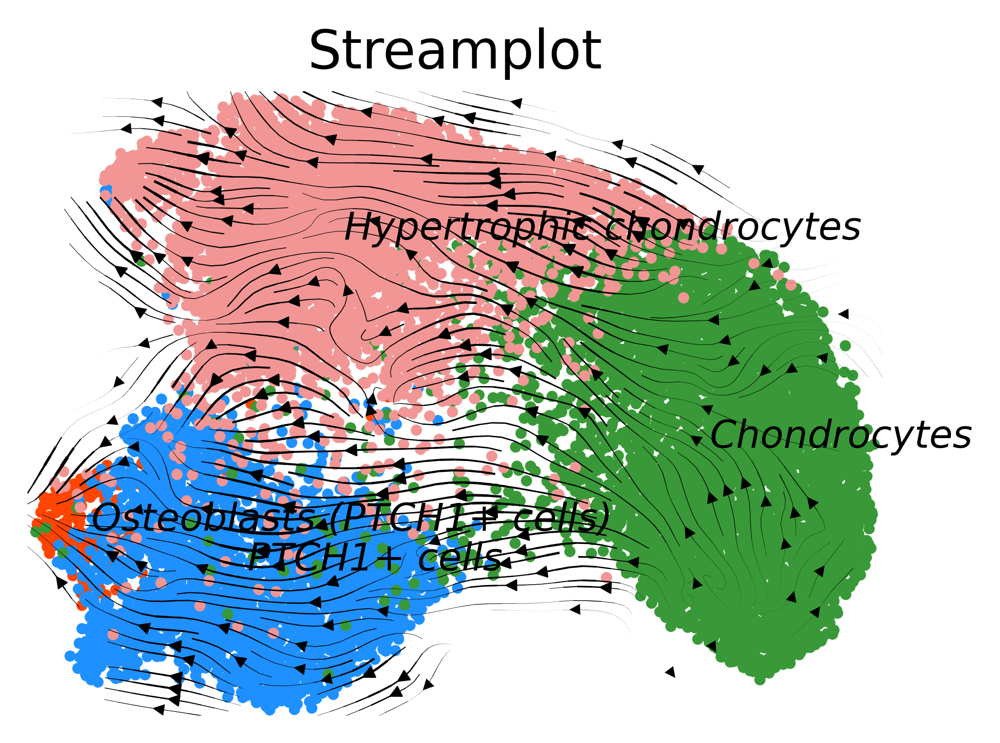

In [28]:
celltype_colors = {
    'Osteoblasts (PTCH1+ cells)': '#FF4500',
    'PTCH1+ cells': '#1E90FF',
    'Chondrocytes': '#399938',
    'Hypertrophic chondrocytes': '#F19695'
}
v0.labels = adata.obs['Celltype'].values.astype(str)
v0.true_label = adata.obs['Celltype'].values.astype(str)

unique_labels1 = np.unique(v0.labels)
unique_labels2 = np.unique(v0.labels)

print(unique_labels1)
print(unique_labels2)


for label in unique_labels1:
    if label not in celltype_colors:
        print(f"Warning: '{label}' not in celltype_colors!")

for label in unique_labels2:
    if label not in celltype_colors:
        print(f"Warning: '{label}' not in celltype_colors!")

fig, ax = via.via_streamplot(v0, embedding=embedding, density_grid=0.5,
                             scatter_size=8, scatter_alpha=1, linewidth=0.5,
                             color_dict=celltype_colors, cmap=None,
                             labels=v0.true_label)
fig.set_size_inches(4,3)

plt.show()
fig.savefig('via_streamplot.pdf', dpi=300, format='pdf')
plt.close()


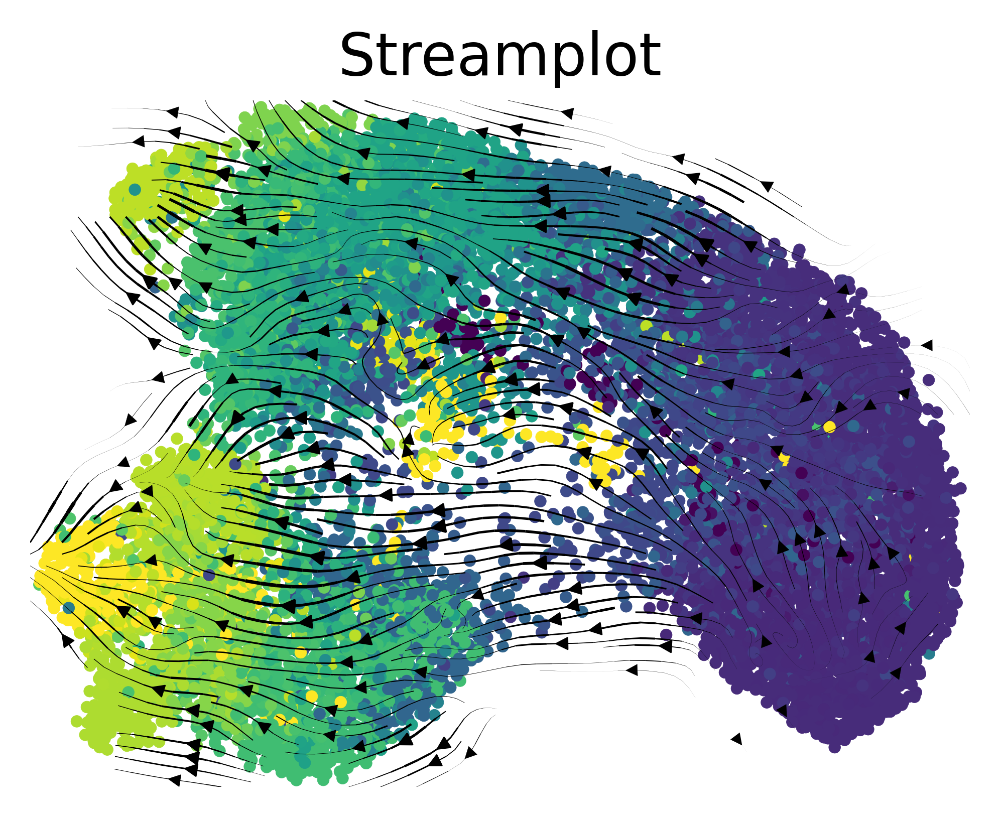

In [32]:
fig, ax = via.via_streamplot(v0, embedding=embedding, density_grid=0.5,
                             scatter_size=8, scatter_alpha=1, linewidth=0.5,
                             color_dict=None,
                             color_scheme="time", cmap="viridis")
fig.set_size_inches(4,3)
plt.get_cmap("viridis")
plt.show()
fig.savefig('via_streamplot_pseudotime.pdf', dpi=300, format='pdf')
plt.close()

In [36]:
pseudotime_array = v0.single_cell_pt_markov
print(embedding)
print(pseudotime_array)
# 保存成DataFrame
pseudotime_df = pd.DataFrame({'cell_id': adata.obs_names, 'pseudotime': pseudotime_array})
pseudotime_df.to_csv('via_pseudotime_output.csv', index=False)


[[-4.97  -2.8  ]
 [-5.97  -5.327]
 [-3.922 -0.526]
 ...
 [ 4.756 -4.583]
 [ 5.717 -3.379]
 [ 5.063 -3.55 ]]
[0.708063863935209, 0.708063863935209, 0.8908541201715987, 0.6938935399774931, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8164598021469032, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.8777429332316081, 0.6517557766472934, 0.9641511342165383, 0.6892945015059038, 1.0, 0.8839185922157644, 0.6517557766472934, 0.628624261090899, 0.9252862464377674, 0.6938935399774931, 0.6938935399774931, 0.7551766710621981, 0.3721085801344496, 0.6517557766472934, 0.6517557766472934, 0.250388851688314, 0.6517557766472934, 0.5066320524661216, 0.5066320524661216, 0.6517557766472934, 0.9641511342165383, 0.5734537843992153, 0.6170787165710129, 0.5544661704109604, 0.5853565834692409, 0.6517557766472934, 0.4770324634005266, 0.9252862464377674, 0.6938935399774931, 0.6938935399774931, 0.69389353